## Аугментация данных в задачах компьютерного зрения (на примере библиотеки albumentations)

### Теория

Аугментация - процесс генерирования новых данных на основе имеющихся.

Позволяет довольно просто и дешево решить часть проблем с обучающей выборкой подручными способами. 

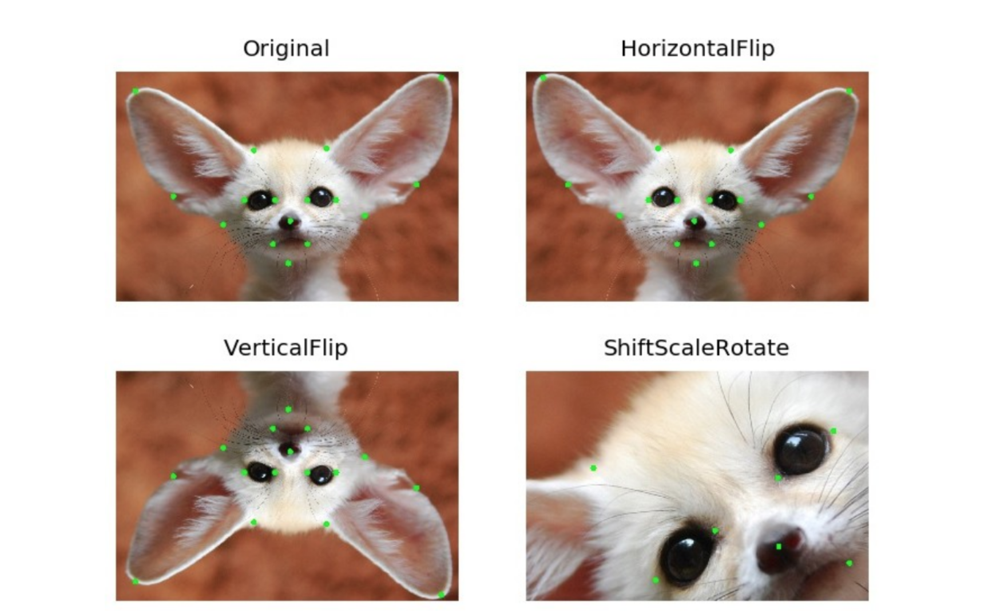

В случае нейронных сетей, распространенным явлением стало встраивать аугментацию непосредственно в процесс обучения, модифицируя данные каждую эпоху.

Изначально, аугментация использовалась в так называемом “офлайн” формате – данные искажались единожды перед обучением и докладывались к имеющимся обучающим данным. 

С наступлением эпохи нейросетей, аугментацию стали активно встраивать прямо в процесс обучения. Часть данных из датасета искажается между итерациями, и за счет этого сеть всегда видит “новые” данные, без увеличения объема обучающей выборки на диске. 

### Возможности библиотеки albumentations

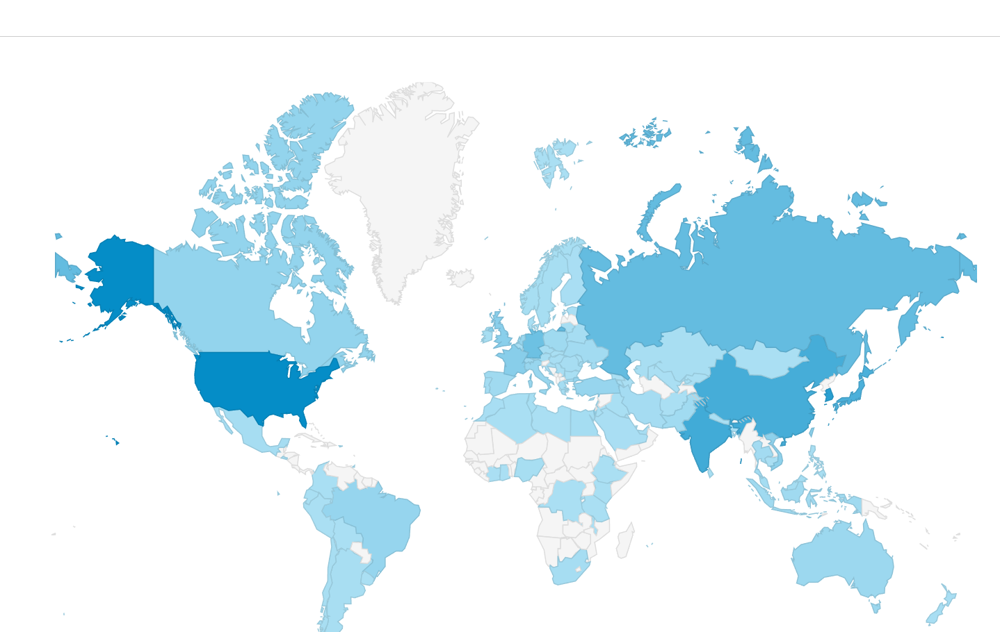

1.   Цветовые трансформации: изменение цветовой сатурации или обесцвечивание;
2.   Геометрические трансформации: изображение обрезают, изменяют размер или поворачивают;
3.   Зашумления, приближение к реальным данным;

In [ ]:
import cv2 
import albumentations as albu
import random
from google.colab.patches import cv2_imshow

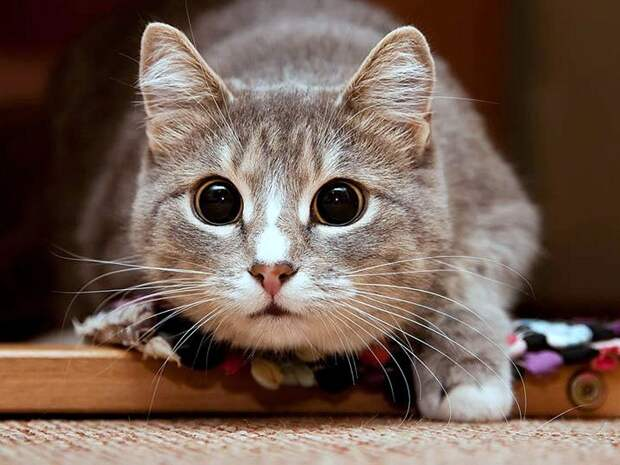

In [ ]:
image = cv2.imread('cat.jpeg')
random.seed(17)
cv2_imshow(image);

### Цветовые

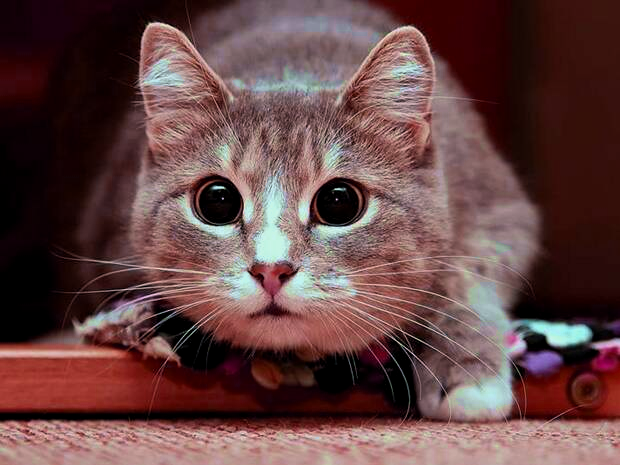

In [ ]:
transform = albu.HueSaturationValue(p=1)

augmented = transform(image=image)
augmented_image = augmented['image']

cv2_imshow(augmented_image);

/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/transforms.py:1615: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  FutureWarning,


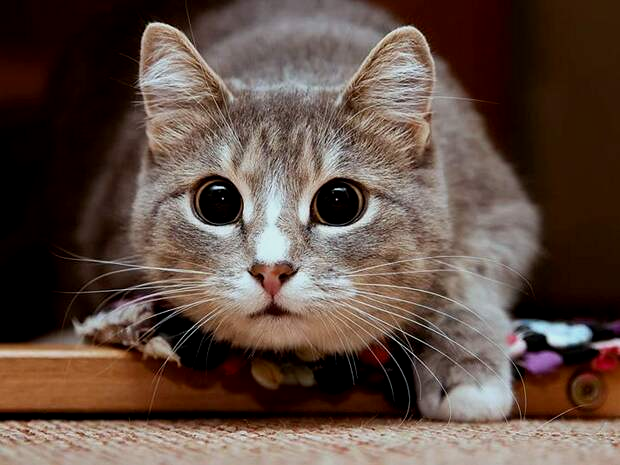

In [ ]:
transform = albu.RandomBrightnessContrast(p=1)

augmented = transform(image=image)
augmented_image = augmented['image']

cv2_imshow(augmented_image);

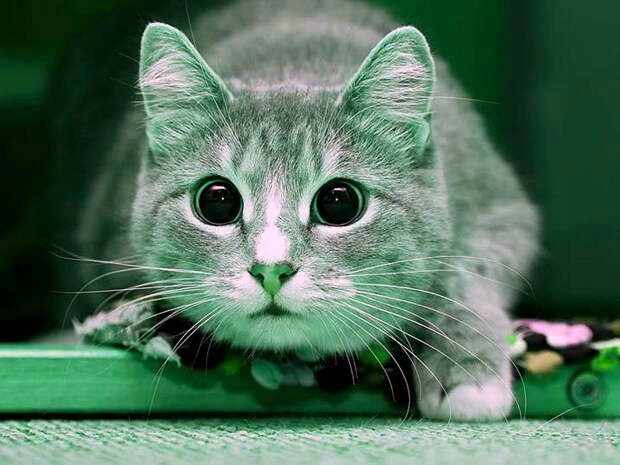

In [ ]:
transform = albu.ChannelShuffle(p=1)

augmented = transform(image=image)
augmented_image = augmented['image']

cv2_imshow(augmented_image);

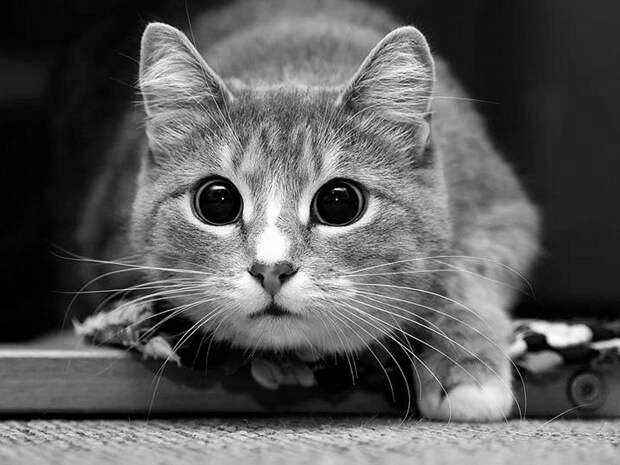

In [ ]:
transform = albu.ToGray(p=1)

augmented = transform(image=image)
augmented_image = augmented['image']

cv2_imshow(augmented_image);

### Геометрические

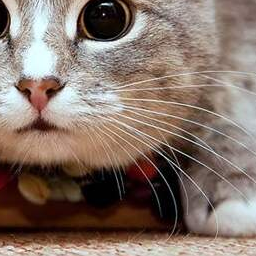

In [ ]:
transform = albu.RandomCrop(256, 256)

augmented = transform(image = image)
augmented_image = augmented['image']
 
cv2_imshow(augmented_image);

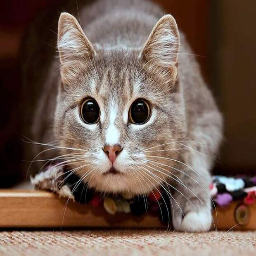

In [ ]:
transform = albu.Resize(256, 256)
augmented = transform(image = image)
augmented_image = augmented['image']
 
cv2_imshow(augmented_image);

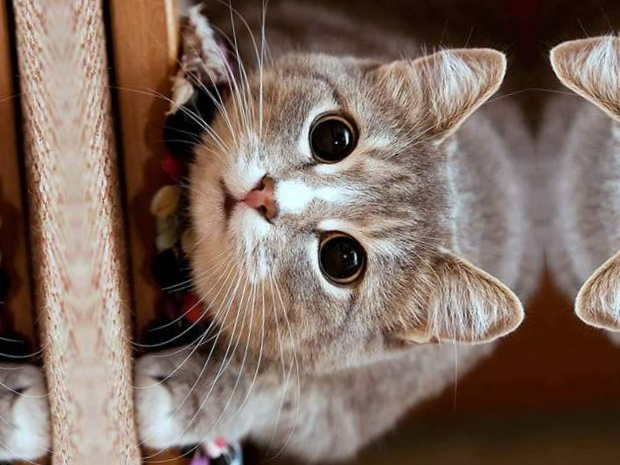

In [ ]:
transform = albu.Rotate()

augmented = transform(image = image)
augmented_image = augmented['image']
 
cv2_imshow(augmented_image);

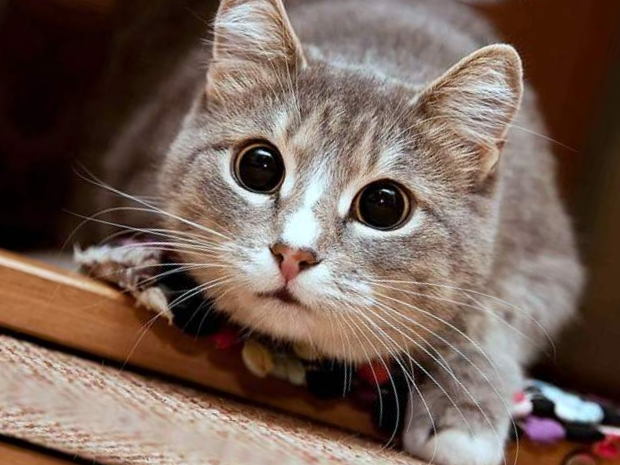

In [ ]:
transform = albu.ShiftScaleRotate(p=1)

augmented = transform(image=image)
augmented_image = augmented['image']

cv2_imshow(augmented_image);

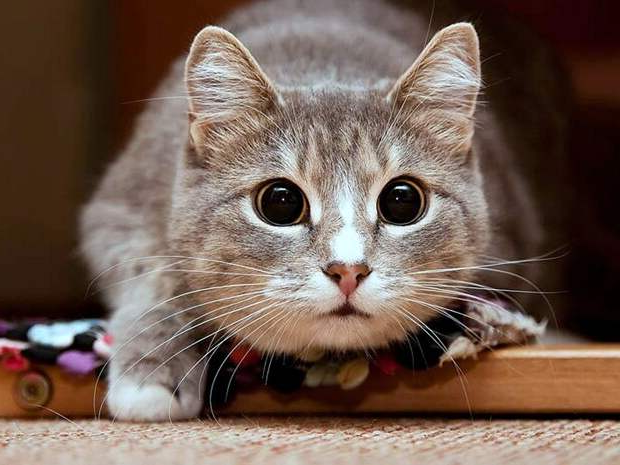

In [ ]:
transform = albu.HorizontalFlip(p=1)

augmented = transform(image = image)
augmented_image = augmented['image']
 
cv2_imshow(augmented_image);

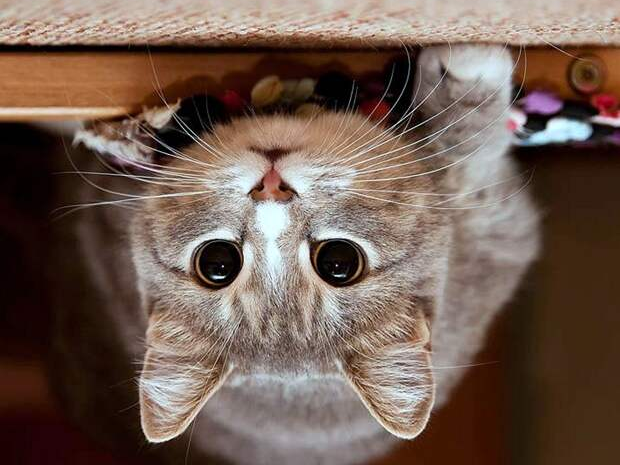

In [ ]:
transform = albu.VerticalFlip(p=1)

augmented = transform(image = image)
augmented_image = augmented['image']
 
cv2_imshow(augmented_image);

### Зашумления

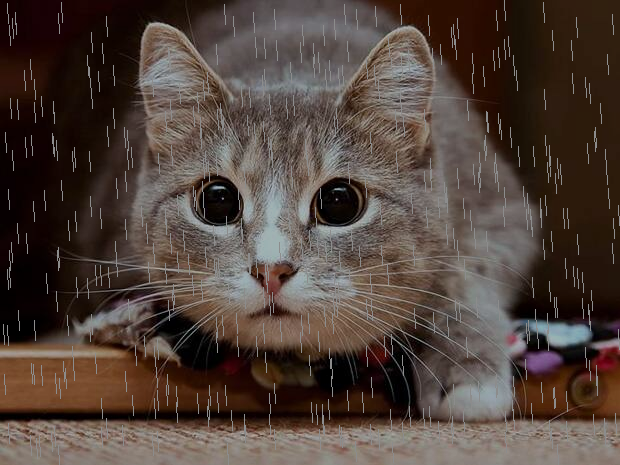

In [ ]:
transform = albu.RandomRain(blur_value=1, p=1)

augmented = transform(image=image)
augmented_image = augmented['image']

cv2_imshow(augmented_image);

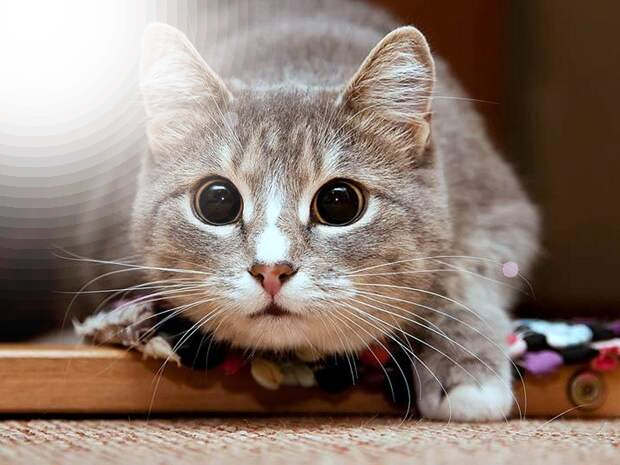

In [ ]:
transform = albu.RandomSunFlare(p=1)

augmented = transform(image=image)
augmented_image = augmented['image']

cv2_imshow(augmented_image);

### Композиция трансформаций и другие возможности

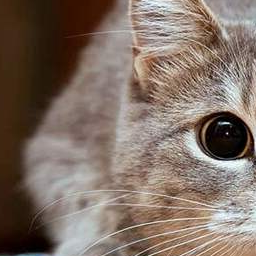

In [ ]:
transform = albu.Compose([
    albu.RandomCrop(width=256, height=256),
    albu.HorizontalFlip(p=1)
])

augmented = transform(image=image)
augmented_image = augmented['image']

cv2_imshow(augmented_image);

Плюсом библиотеки является также возможность трансформировать keypoints и bboxes:

https://albumentations.ai/docs/getting_started/bounding_boxes_augmentation/

https://albumentations.ai/docs/getting_started/keypoints_augmentation/

[(74, 91)]


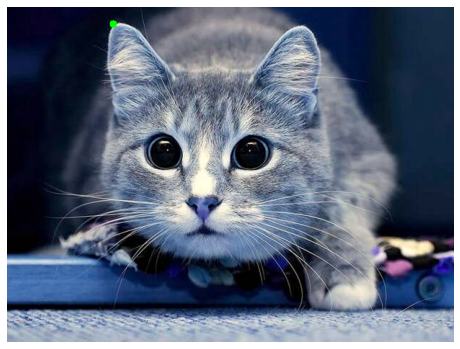

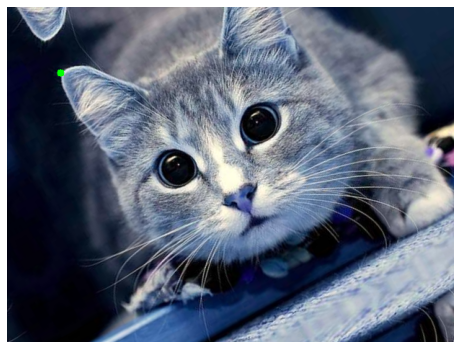

In [ ]:
import matplotlib.pyplot as plt

KEYPOINT_COLOR = (0, 255, 0)

def vis_keypoints(image, keypoints, color=KEYPOINT_COLOR, diameter=5):
    image = image.copy()

    for (x, y) in keypoints:
        cv2.circle(image, (int(x), int(y)), diameter, (0, 255, 0), -1)
        
    plt.figure(figsize=(8, 8))
    plt.axis('off')
    plt.imshow(image)

keypoints = [
    (147, 23)
]

transform = albu.Compose([
    albu.ShiftScaleRotate(p=1),
], keypoint_params=albu.KeypointParams(format='xy'))

augmented = transform(image=image, keypoints=keypoints)
augmented_image = augmented['image']
augmented_keypoints = augmented['keypoints']
print(augmented_keypoints)
vis_keypoints(image, keypoints)
vis_keypoints(augmented_image, augmented_keypoints)

[(2.0000000000000018, 0.0, 310.0, 280.0)]


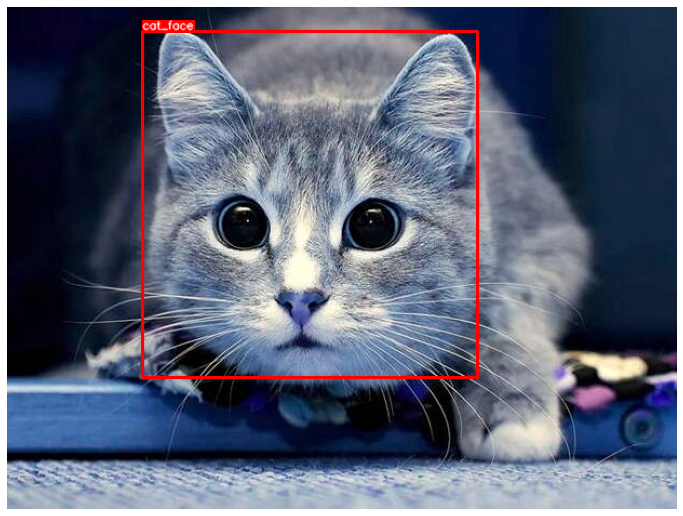

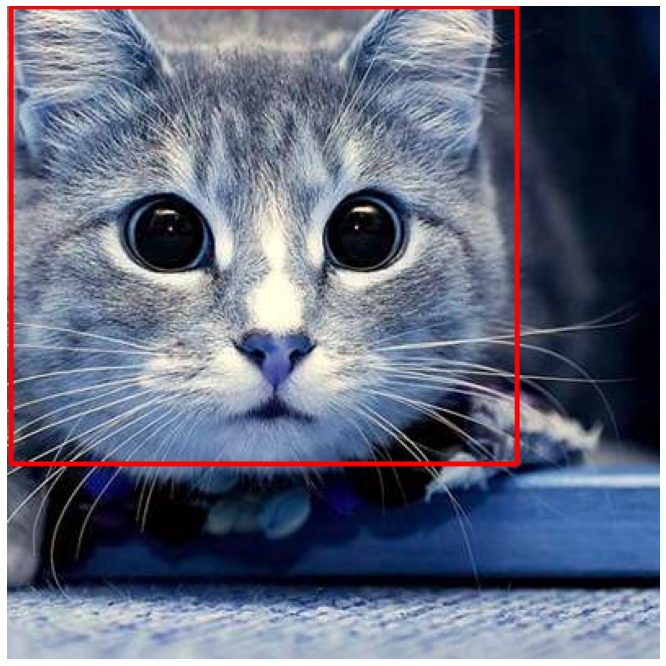

In [ ]:
BOX_COLOR = (255, 0, 0)
TEXT_COLOR = (255, 255, 255)


def visualize_bbox(img, bbox, class_name, color=BOX_COLOR, thickness=2):
    """Visualizes a single bounding box on the image"""
    x_min, y_min, w, h = bbox
    x_min, x_max, y_min, y_max = int(x_min), int(x_min + w), int(y_min), int(y_min + h)
   
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)    
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(
        img,
        text=class_name,
        org=(x_min, y_min - int(0.3 * text_height)),
        fontFace=cv2.FONT_HERSHEY_SIMPLEX,
        fontScale=0.35, 
        color=TEXT_COLOR, 
        lineType=cv2.LINE_AA,
    )
    return img

def visualize(image, bboxes, category_ids, category_id_to_name):
    img = image.copy()
    for bbox, category_id in zip(bboxes, category_ids):
        class_name = category_id_to_name[category_id]
        img = visualize_bbox(img, bbox, class_name)
    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.imshow(img)

bboxes = [[125, 23, 310, 320]]
category_ids = [1]
category_id_to_name = {1: 'cat_face'}

transform = albu.Compose([
    albu.RandomCrop(width=400, height=400),
    albu.HorizontalFlip(p=0.5)
], bbox_params = albu.BboxParams(format='coco', min_visibility = 0.3, label_fields=['category_ids']))

augmented = transform(image=image, bboxes=bboxes, category_ids=category_ids)

print(augmented['bboxes'])
visualize(image, bboxes, category_ids, category_id_to_name)
visualize(augmented['image'], augmented['bboxes'], augmented['category_ids'], category_id_to_name)

### Итоги

Аугментация является одним из главных инструментов для улучшения качества модели, на примере open-source библиотеки Albumentations мы познакомились с основными способами увеличения датасета

Преимущества библиотеки: скорость, широкий спектр преобразований, простота использования, синтез недостающих частей, вероятность применения трансформации, применение трансформаций к keyoints и bboxes

Недостатки: нет поддержки 3D, нет работы на GPU